# Training and Evaluating FiftyOne Datasets with Detectron2

FiftyOne has all of the building blocks necessary to develop high-quality datasets to train your models, as well as advanced model evaluation capabilities. To make use of these, FiftyOne easily integrates with your existing model training and inference pipelines. In this walktrhough we'll cover how you can use your FiftyOne datasets to train a model with [Detectron2](https://github.com/facebookresearch/detectron2), Facebook AI Reasearch's library for detection and segmentation algorithms.

This walkthrough is based off of the [official Detectron2 tutorial](https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5), augmented to load data to and from FiftyOne.


Specifically, this walkthrough covers:

- Loading a dataset from the FiftyOne Zoo, and splitting it into training/validation
- Initializing a segmentation model from the detectron2 model zoo
- Loading ground truth annotations from a FiftyOne dataset into a detectron2 model training pipeline and training the model
- Loading predictions from a detectron2 model into a FiftyOne dataset
- Evaluating model predictions in FiftyOne


**So, what’s the takeaway?**

By writing two simple functions, you can integrate FiftyOne into your Detectron2 model training and inference pipelines.

## Setup

To get started, you need to install [FiftyOne](https://voxel51.com/docs/fiftyone/getting_started/install.html) and [detectron2](https://detectron2.readthedocs.io/en/latest/tutorials/install.html):

In [ ]:
!pip install fiftyone

In [ ]:
import fiftyone as fo
import fiftyone.zoo as foz

In [ ]:
!python -m pip install pyyaml==5.1

# Detectron2 has not released pre-built binaries for the latest pytorch (https://github.com/facebookresearch/detectron2/issues/4053)
# so we install from source instead. This takes a few minutes.
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

# Install pre-built detectron2 that matches pytorch version, if released:
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
#!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/{CUDA_VERSION}/{TORCH_VERSION}/index.html

In [ ]:
import torch, detectron2
!nvcc --version
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
print("detectron2:", detectron2.__version__)

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2020 NVIDIA Corporation
Built on Mon_Oct_12_20:09:46_PDT_2020
Cuda compilation tools, release 11.1, V11.1.105
Build cuda_11.1.TC455_06.29190527_0
torch:  1.12 ; cuda:  cu113
detectron2: 0.6


In [ ]:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, cv2

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.data import MetadataCatalog, DatasetCatalog

## Train on a FiftyOne dataset

In this section, we show how to use a custom FiftyOne Dataset to train a detectron2 model.
We'll train a license plate segmentation model from an existing model pre-trained on COCO dataset, available in detectron2's model zoo.

Since the COCO dataset doesn't have a "Vehicle registration plates" category, we will be using segmentations of license plates from the Open Images v6 dataset in the [FiftyOne Dataset Zoo](https://voxel51.com/docs/fiftyone/user_guide/dataset_zoo/datasets.html#open-images-v6) to train the model to recognize this new category.


## Prepare the dataset

For this example, we will just use some of the samples from the official "validation" split of the dataset. To improve model performance, we could always add in more data from the official "train" split as well but that will take longer to train so we'll just stick to the "validation" split for this walkthrough.

In [ ]:
dataset = foz.load_zoo_dataset(
    "open-images-v6",
    split="validation",
    classes=["Vehicle registration plate"],
    label_types=["segmentations"],
    label_field="segmentations",
)

Specifying a `classes` when downloading a dataset from the zoo will ensure that only samples with one of the given classes will be present. However, these samples may still contain other labels, so we can use the powerful [filtering capability](https://voxel51.com/docs/fiftyone/user_guide/using_views.html#filtering) of FiftyOne to easily keep only the "Vehicle registration plate" labels.
We will also untag these samples as "validation" and create our own split out of them.

In [ ]:
from fiftyone import ViewField as F

# Remove other classes and existing tags
dataset.filter_labels("segmentations", F("label") == "Vehicle registration plate").save()
dataset.untag_samples("validation")

In [ ]:
import fiftyone.utils.random as four

four.random_split(dataset, {"train": 0.8, "val": 0.2})

Next we will register the FiftyOne dataset to detectron2, following the [detectron2 custom dataset tutorial](https://detectron2.readthedocs.io/tutorials/datasets.html).
Here, the dataset is in its custom format, therefore we write a function to parse it and prepare it into [detectron2's standard format](https://detectron2.readthedocs.io/en/latest/tutorials/datasets.html#standard-dataset-dicts).

Note: In this example, we are specifically parsing the segmentations into bounding boxes and polylines. This function may require tweaks depending on the model being trained and the data it expects.


In [ ]:
from detectron2.structures import BoxMode

def get_fiftyone_dicts(samples):
    samples.compute_metadata()

    dataset_dicts = []
    for sample in samples.select_fields(["id", "filepath", "metadata", "segmentations"]):
        height = sample.metadata["height"]
        width = sample.metadata["width"]
        record = {}
        record["file_name"] = sample.filepath
        record["image_id"] = sample.id
        record["height"] = height
        record["width"] = width

        objs = []
        for det in sample.segmentations.detections:
            tlx, tly, w, h = det.bounding_box
            bbox = [int(tlx*width), int(tly*height), int(w*width), int(h*height)]
            fo_poly = det.to_polyline()
            poly = [(x*width, y*height) for x, y in fo_poly.points[0]]
            poly = [p for x in poly for p in x]
            obj = {
                "bbox": bbox,
                "bbox_mode": BoxMode.XYWH_ABS,
                "segmentation": [poly],
                "category_id": 0,
            }
            objs.append(obj)

        record["annotations"] = objs
        dataset_dicts.append(record)

    return dataset_dicts

for d in ["train", "val"]:
    view = dataset.match_tags(d)
    DatasetCatalog.register("fiftyone_" + d, lambda view=view: get_fiftyone_dicts(view))
    MetadataCatalog.get("fiftyone_" + d).set(thing_classes=["vehicle_registration_plate"])

metadata = MetadataCatalog.get("fiftyone_train")

To verify the dataset is in correct format, let's visualize the annotations of the training set:




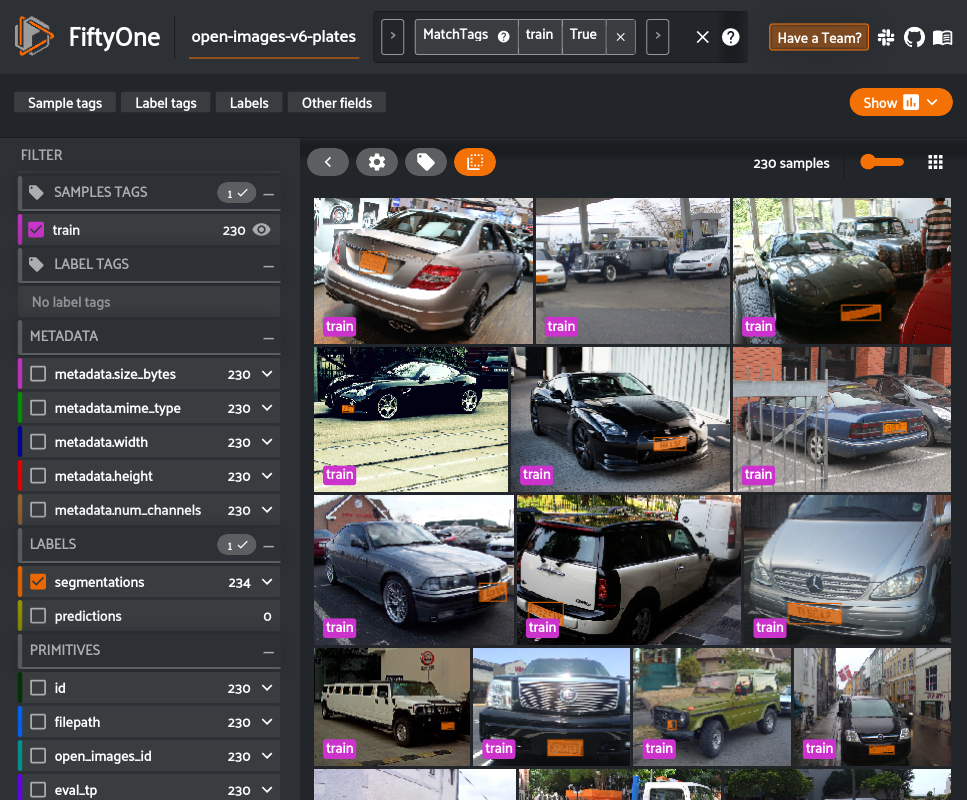

In [ ]:
dataset_dicts = get_fiftyone_dicts(dataset.match_tags("train"))
ids = [dd["image_id"] for dd in dataset_dicts]

view = dataset.select(ids)
session = fo.launch_app(view)

In [ ]:
session.freeze()  # screenshot the App

## Load the model and train!

Now, let's fine-tune a COCO-pretrained R50-FPN Mask R-CNN model on the FiftyOne dataset. It takes ~2 minutes to train 300 iterations on a P100 GPU.


In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("fiftyone_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2  # This is the real "batch size" commonly known to deep learning people
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # The "RoIHead batch size". 128 is faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # only has one class (Vehicle registration plate). (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

![tensorboard](images/detectron2_tensorboard.png)

## Inference & evaluation using the trained model
Now, let's run inference with the trained model on the license plate validation dataset. First, let's create a predictor using the model we just trained:



In [ ]:
# Inference should use the config with parameters that are used in training
# cfg now already contains everything we've set previously. We changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

Then, we generate predictions on each sample in the validation set, and convert the outputs from detectron2 to FiftyOne format, then add them to our FiftyOne dataset.

In [ ]:
def detectron_to_fo(outputs, img_w, img_h):
    # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    detections = []
    instances = outputs["instances"].to("cpu")
    for pred_box, score, c, mask in zip(
        instances.pred_boxes, instances.scores, instances.pred_classes, instances.pred_masks,
    ):
        x1, y1, x2, y2 = pred_box
        fo_mask = mask.numpy()[int(y1):int(y2), int(x1):int(x2)]
        bbox = [float(x1)/img_w, float(y1)/img_h, float(x2-x1)/img_w, float(y2-y1)/img_h]
        detection = fo.Detection(label="Vehicle registration plate", confidence=float(score), bounding_box=bbox, mask=fo_mask)
        detections.append(detection)

    return fo.Detections(detections=detections)

In [ ]:
val_view = dataset.match_tags("val")
dataset_dicts = get_fiftyone_dicts(val_view)
predictions = {}
for d in dataset_dicts:
    img_w = d["width"]
    img_h = d["height"]
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    detections = detectron_to_fo(outputs, img_w, img_h)
    predictions[d["image_id"]] = detections

dataset.set_values("predictions", predictions, key_field="id")

Computing image metadata...
 100% |███████████████████| 57/57 [328.7ms elapsed, 0s remaining, 173.4 samples/s]      


Let's visualize the predictions and take a look at how the model did. We can click the eye icon next to the "val" tag to view all of the validation samples that we ran inference on.


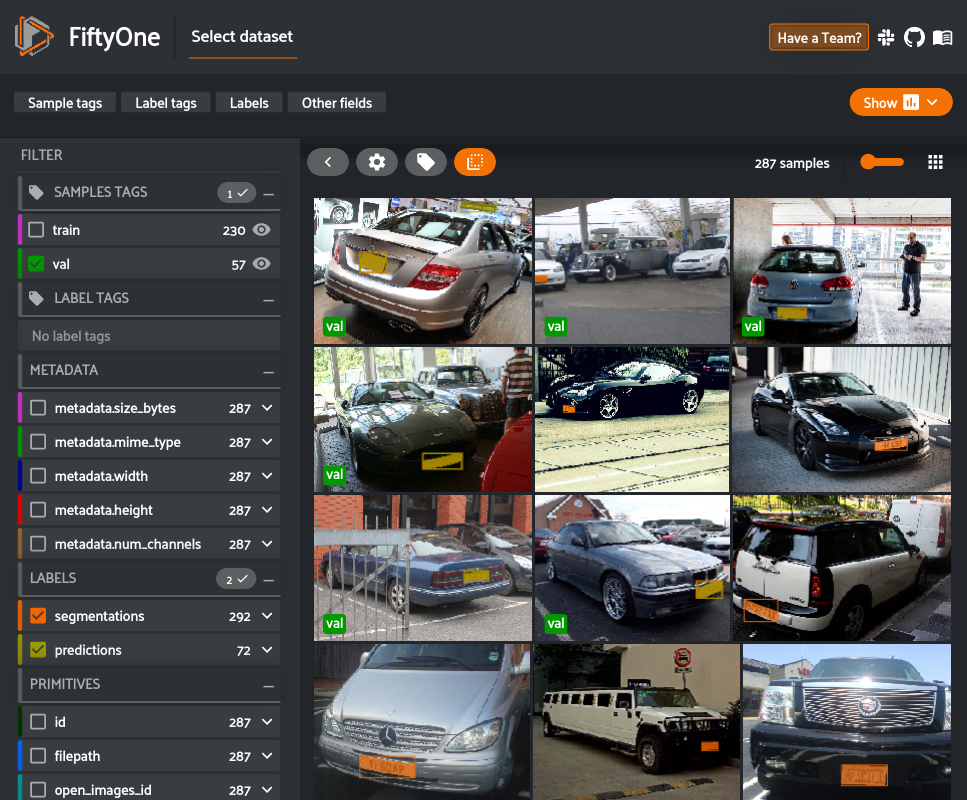

In [6]:
session = fo.launch_app(dataset)

In [8]:
session.freeze()  # screenshot the App

From here, we can use the built-in [evaluation methods](https://voxel51.com/docs/fiftyone/user_guide/evaluation.html#detections) provided by FiftyOne. The `evaluate_detections()` method can be used to evaluate the instance segmentations using the `use_masks=True` parameter. We can also use this to compute mAP with the options being the [COCO-style](https://voxel51.com/docs/fiftyone/integrations/coco.html#map-protocol) (default) or [Open Images-style](https://voxel51.com/docs/fiftyone/integrations/open_images.html#map-protocol) mAP protocol.

In [ ]:
results = dataset.evaluate_detections(
    "predictions",
    gt_field="segmentations",
    eval_key="eval",
    use_masks=True,
    compute_mAP=True,
)

Evaluating detections...
 100% |█████████████████| 287/287 [1.2s elapsed, 0s remaining, 237.9 samples/s]         
Performing IoU sweep...
 100% |█████████████████| 287/287 [953.7ms elapsed, 0s remaining, 302.4 samples/s]      


We can use this results object to view the mAP, print an evaluation report, plot PR curves, plot confusion matrices, and more.

In [11]:
results.mAP()

0.12387340239495186

In [12]:
results.print_report()

                            precision    recall  f1-score   support

Vehicle registration plate       0.72      0.18      0.29       292

                 micro avg       0.72      0.18      0.29       292
                 macro avg       0.72      0.18      0.29       292
              weighted avg       0.72      0.18      0.29       292



In [ ]:
results.plot_pr_curves()

![pr-curve](images/detectron2_pr.png)

From the PR curve we can see that the model is not generating many predictions---resulting in many false negatives---but the predictions that are generated are often fairly accurate.

We can also create a view into the dataset looking at high-confidence false positive predictions to understand where the model is going wrong and how to potentially improve it in the future.


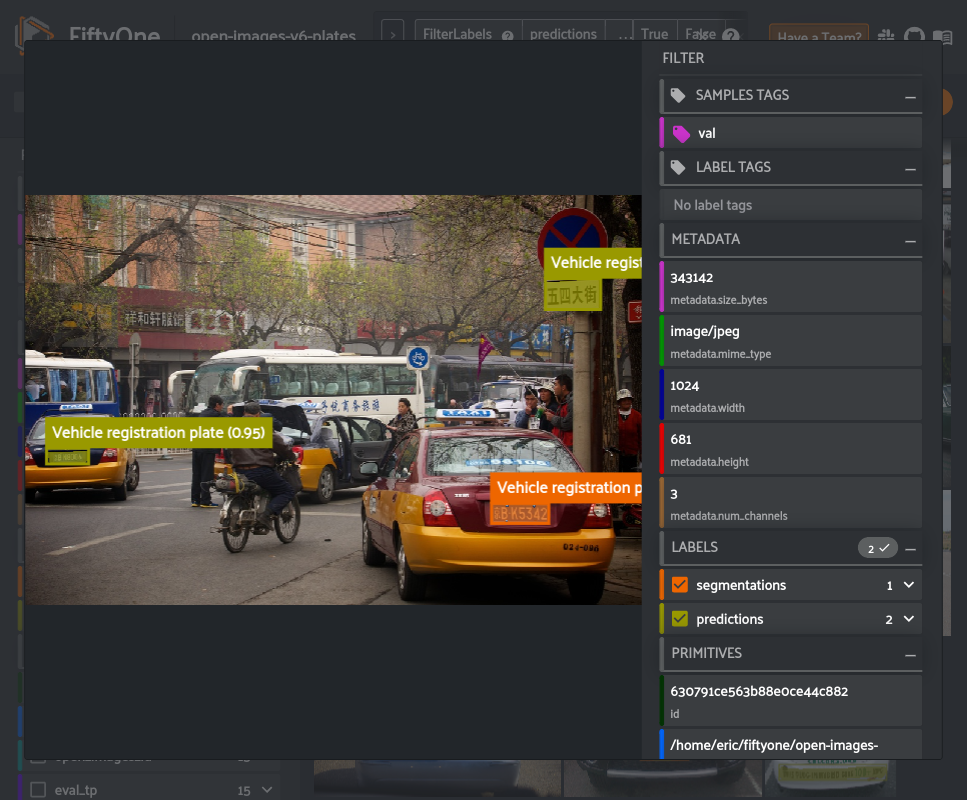

In [ ]:
from fiftyone import ViewField as F

session.view = dataset.filter_labels("predictions", (F("eval") == "fp") & (F("confidence") > 0.8))

In [ ]:
session.freeze()  # screenshot the App

There are a few samples with false positives like this one that contain plates with characters not from the Latin alphabet indicating we may want to introduce images from a wider range of countries into the training set.